In [148]:
import numpy as np
import pandas as pd
import torch
from torch.utils.data import TensorDataset, DataLoader,Dataset
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms
import torch.optim as optim
from torch.optim import lr_scheduler

import json
from sklearn import tree
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.impute import SimpleImputer
from collections import Counter
from sklearn.preprocessing import LabelEncoder, scale
from sklearn.datasets import load_boston
from sklearn.cross_decomposition import PLSRegression, PLSSVD
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, roc_auc_score, accuracy_score, r2_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from pandas.plotting import scatter_matrix
from datetime import datetime
from scipy import stats
import torch.utils.data
from sklearn.model_selection import train_test_split
from sklearn.ensemble import IsolationForest

import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', 500)

In [149]:
train_csv = pd.read_csv("Train.csv", keep_default_na=False)
test_csv = pd.read_csv("Test.csv", keep_default_na=False)

In [150]:
train_csv.shape

(33750, 15)

In [151]:
print(train_csv.dtypes)

date_time               object
is_holiday              object
air_pollution_index      int64
humidity                 int64
wind_speed               int64
wind_direction           int64
visibility_in_miles      int64
dew_point                int64
temperature            float64
rain_p_h               float64
snow_p_h               float64
clouds_all               int64
weather_type            object
weather_description     object
traffic_volume           int64
dtype: object


In [152]:
def convertAbsoluteTime(x):
    if x != "":
        datet = datetime.strptime(x, "%Y-%m-%d %H:%M:%S")
        return datet.timestamp()
    return x

def convertDayOfWeek(x):
    if x != "":
        datet = datetime.strptime(x, "%Y-%m-%d %H:%M:%S")
        return datet.timetuple().tm_wday
    return x

def convertDayOfYear(x):
    if x != "":
        datet = datetime.strptime(x, "%Y-%m-%d %H:%M:%S")
        return datet.timetuple().tm_yday
    return x

def convertDayOfMonth(x):
    if x != "":
        datet = datetime.strptime(x, "%Y-%m-%d %H:%M:%S")
        return datet.timetuple().tm_mday
    return x

def convertHourOfYear(x):
    if x != "":
        datet = datetime.strptime(x, "%Y-%m-%d %H:%M:%S")
        return datet.timetuple().tm_hour
    return x

def convertHour(x):
    if x != "":
        h = datetime.strptime(x, "%Y-%m-%d %H:%M:%S").strftime("%H")
        return int(h)
    return x

In [153]:
def preprocess_data(dataset):
    dataset['absolute_time'] = dataset["date_time"].apply(convertAbsoluteTime)
    dataset['day_of_week'] = dataset["date_time"].apply(convertDayOfWeek)
    dataset['day_of_year'] = dataset["date_time"].apply(convertDayOfYear)
    dataset['hour_of_day'] = dataset["date_time"].apply(convertHourOfYear)
    #dataset['day_of_month'] = dataset["date_time"].apply(convertDayOfMonth)
    dataset['hours'] = dataset["date_time"].apply(convertHour)
       
    dataset = dataset.replace('NaN', '')
    #dataset['weather_description'] = dataset["weather_description"].replace(" ", "_", regex=True).str.lower()
    #dataset['is_holiday'] = dataset["is_holiday"].replace(" ", "_", regex=True).str.lower()    

    for col in list(dataset.columns):
        if dataset[col].dtype == np.float64 or dataset[col].dtype == np.int64:
            dataset[col] = pd.to_numeric(dataset[col])
            #dataset[col] = dataset[col].mask(dataset[col]<=0)
    
    #dataset.sort_values("date_time", inplace=True)
    dataset = dataset.drop(['date_time'],axis=1)
    #dataset = dataset.drop(['weather_type'],axis=1)
    dataset = dataset.drop(['visibility_in_miles'],axis=1)
    
    #dataset = dataset.drop(['Year'],axis=1)
    return dataset

In [154]:
out_date_time = test_csv['date_time'].values
train = preprocess_data(train_csv)
test = preprocess_data(test_csv)

display(train.head())

,is_holiday,air_pollution_index,humidity,wind_speed,wind_direction,dew_point,temperature,rain_p_h,snow_p_h,clouds_all,weather_type,weather_description,traffic_volume,absolute_time,day_of_week,day_of_year,hour_of_day,hours
0,None,121,89,2,329,1,288.28,0.0,0.0,40,Clouds,scattered clouds,5545,1.349149e+09,1,276,9,9
1,None,178,67,3,330,1,289.36,0.0,0.0,75,Clouds,broken clouds,4516,1.349152e+09,1,276,10,10
2,None,113,66,3,329,2,289.58,0.0,0.0,90,Clouds,overcast clouds,4767,1.349156e+09,1,276,11,11
3,None,20,66,3,329,5,290.13,0.0,0.0,90,Clouds,overcast clouds,5026,1.349159e+09,1,276,12,12
4,None,281,65,3,329,7,291.14,0.0,0.0,75,Clouds,broken clouds,4918,1.349163e+09,1,276,13,13


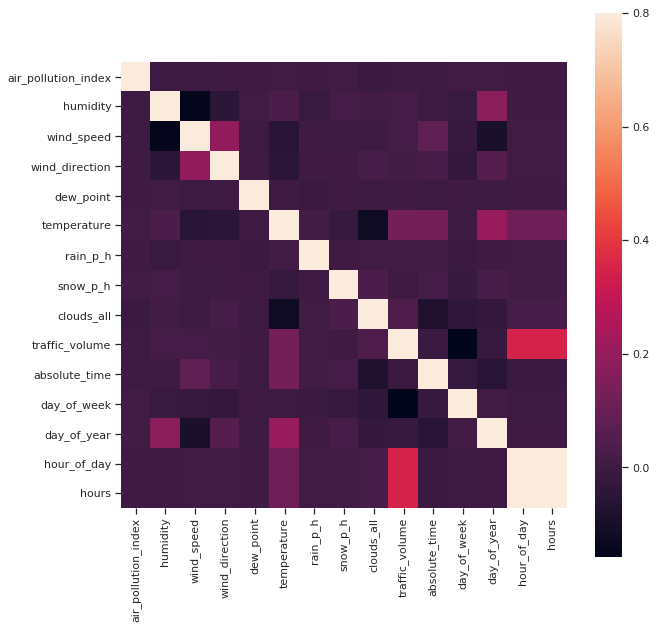

In [155]:
newcorr = train.corr()
f, ax = plt.subplots(figsize=(10, 10))
sns.heatmap(newcorr, xticklabels=newcorr.columns.values, yticklabels=newcorr.columns.values, vmax=.8, square=True)

Load Train and Test Datasets

In [156]:
cols = ['hours', 'air_pollution_index', 'humidity', 'wind_speed', 'wind_direction','dew_point' ,'temperature', 'rain_p_h', 
        'snow_p_h','clouds_all', 'traffic_volume']
sns.set(style="ticks", color_codes=True)
sns.pairplot(train[cols], height = 10)
plt.show();

In [157]:
for c in ["weather_description", "is_holiday", "weather_type"]:
    lbl = LabelEncoder() 
    lbl.fit(list(np.concatenate((train[c].values, test[c].values), axis=None))) 
    train[c] = lbl.transform(list(train[c].values))
    test[c] = lbl.transform(list(test[c].values))

In [158]:
"""
le_holiday = LabelEncoder()
le_holiday.fit(np.concatenate((train['is_holiday'].values, test['is_holiday'].values), axis=None))
train['is_holiday'] = le_holiday.transform(train['is_holiday'])

le_wtype = LabelEncoder()
le_wtype.fit(train['weather_type'])
train['weather_type'] = le_wtype.transform(train['weather_type'])

le_wdesc = LabelEncoder()
le_wdesc.fit(train['weather_description'])
train['weather_description'] = le_wdesc.fit_transform(train['weather_description'])

test['is_holiday'] = le_holiday.transform(test['is_holiday'])
test['weather_type'] = le_wtype.transform(test['weather_type'])
test['weather_description'] = le_wdesc.transform(test['weather_description'])
"""

"\nle_holiday = LabelEncoder()\nle_holiday.fit(np.concatenate((train['is_holiday'].values, test['is_holiday'].values), axis=None))\ntrain['is_holiday'] = le_holiday.transform(train['is_holiday'])\n\nle_wtype = LabelEncoder()\nle_wtype.fit(train['weather_type'])\ntrain['weather_type'] = le_wtype.transform(train['weather_type'])\n\nle_wdesc = LabelEncoder()\nle_wdesc.fit(train['weather_description'])\ntrain['weather_description'] = le_wdesc.fit_transform(train['weather_description'])\n\ntest['is_holiday'] = le_holiday.transform(test['is_holiday'])\ntest['weather_type'] = le_wtype.transform(test['weather_type'])\ntest['weather_description'] = le_wdesc.transform(test['weather_description'])\n"

In [159]:
linearcols = ['hours', 'humidity', 'temperature', 'rain_p_h', 'weather_description', 'is_holiday','traffic_volume']
linearcolstest = ['hours', 'humidity', 'temperature', 'rain_p_h', 'weather_description', 'is_holiday']

train = train[linearcols]
test = test[linearcolstest]

predict_set = train.traffic_volume

scaler = MinMaxScaler()
scaler.fit(train)
#train = scaler.transform(train)

train_num_scale = pd.DataFrame(scaler.transform(train),columns = train.columns)

mat_new = np.matrix(train.drop('traffic_volume',axis = 1))
prepro_test = MinMaxScaler()
prepro_test.fit(mat_new)
#X_test = prepro_test.transform(test)

test_num_scale = pd.DataFrame(prepro_test.transform(test),columns = test.columns)

yscaler = MinMaxScaler()
yscaler.fit(predict_set.values.reshape(33750,1))
#y_train = yscaler.transform(y_train)

MinMaxScaler(copy=True, feature_range=(0, 1))

In [160]:
#Splitting X and y
X = train_num_scale.iloc[:, train_num_scale.columns != 'traffic_volume']
y = train_num_scale.iloc[:, -1]

In [161]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=0)

#X_train, X_val, y_train, y_val = train_test_split(train_new, prediction_set, test_size=0.33, random_state=42)

train_set_tensor = torch.utils.data.TensorDataset(torch.FloatTensor(X_train.values), torch.FloatTensor(y_train.values))
val_set = torch.utils.data.TensorDataset(torch.FloatTensor(X_val.values), torch.FloatTensor(y_val.values))

batch_size = 32
train_loader = torch.utils.data.DataLoader(train_set_tensor, batch_size=batch_size, shuffle=True)
val_loader = torch.utils.data.DataLoader(val_set, batch_size=batch_size)
val_test_loader = torch.utils.data.DataLoader(val_set,batch_size=1, shuffle=False)

In [162]:
#Fitting the train set ot Gradient Boosting Regressor
"""
from sklearn.ensemble import GradientBoostingRegressor
regressor = GradientBoostingRegressor(n_estimators=1500)
regressor.fit(X_train, y_train)
from math import sqrt
#Predicting the values
y_pred_val = regressor.predict(X_val)

from sklearn.metrics import r2_score
r2 = r2_score(y_val, np.absolute(y_pred_val))
print(r2)
"""

'\nfrom sklearn.ensemble import GradientBoostingRegressor\nregressor = GradientBoostingRegressor(n_estimators=1500)\nregressor.fit(X_train, y_train)\nfrom math import sqrt\n#Predicting the values\ny_pred_val = regressor.predict(X_val)\n\nfrom sklearn.metrics import r2_score\nr2 = r2_score(y_val, np.absolute(y_pred_val))\nprint(r2)\n'

In [163]:
"""
y_pred_test = regressor.predict(test_num_scale)                           
output = {'date_time': out_date_time, 
          'traffic_volume': np.absolute(yscaler.inverse_transform(np.array(y_pred_test).reshape(14454,1)).squeeze())}
#print(yscaler.inverse_transform(np.array(y_pred_test).reshape(14454,1)).squeeze())
final_output = pd.DataFrame(output)
final_output['traffic_volume'] = final_output['traffic_volume'].round(2)
final_output.to_csv('output_v5.csv', index=False)
"""

"\ny_pred_test = regressor.predict(test_num_scale)                           \noutput = {'date_time': out_date_time, \n          'traffic_volume': np.absolute(yscaler.inverse_transform(np.array(y_pred_test).reshape(14454,1)).squeeze())}\n#print(yscaler.inverse_transform(np.array(y_pred_test).reshape(14454,1)).squeeze())\nfinal_output = pd.DataFrame(output)\nfinal_output['traffic_volume'] = final_output['traffic_volume'].round(2)\nfinal_output.to_csv('output_v5.csv', index=False)\n"

In [164]:
# Hyperparameters
num_epochs = 2000
# Learning Rate
learning_rate = 0.002
# Model parameters
# Input size
input_size = X_train.shape[1]
# Output size
output_size = 1
# Embedding Dimension
#embedding_dim = 128
# Hidden Dimension
hidden_dim = 128
# Number of RNN Layers
n_layers = 2

# Show stats for every n number of batches
show_every_n_batches = 50

In [165]:
import torch.nn as nn

class DNNClassifier(nn.Module):
    """
    This is the simple DNN model we will be using to perform Sentiment Analysis.
    """

    def __init__(self, hidden_dim, input_size, output_size, dropout=0.5):
        """
        Initialize the model by settingg up the various layers.
        """
        super(DNNClassifier, self).__init__()

        self.sig = nn.Sigmoid()        
        # self.word_dict = None
        
        self.fc1 = nn.Linear(input_size, hidden_dim * 4)
        self.fc2 = nn.Linear(hidden_dim * 4, hidden_dim * 2)
        #self.fc3 = nn.Linear(hidden_dim * 4, hidden_dim * 2)
        self.fc4 = nn.Linear(hidden_dim * 2, hidden_dim)
        self.out = nn.Linear(hidden_dim, output_size)
        self.dropout = nn.Dropout(p=0.5)
        self.init_weights()
        
    def init_weights(m):
        initrange = 0.08
        classname = m.__class__.__name__
        if classname.find('Linear') != -1:
            # get the number of the inputs
            n = m.in_features
            y = 1.0/np.sqrt(n)
            m.weight.data.normal_(0.0, y)
            m.bias.data.fill_(0)
        
    def forward(self, x):
        """
        Perform a forward pass of our model on some input.
        """
        x = F.relu(self.fc1(x))
        x = self.dropout(x)
        x = F.relu(self.fc2(x))
        x = self.dropout(x)
        x = F.relu(self.fc4(x))
        x = self.dropout(x)
        out = self.out(x)
        return out

In [166]:
from torch.autograd import Variable

def forward_back_prop(rnn, optimizer, criterion, inputs, labels, clip=9):

    if(train_on_gpu):
        inputs, labels = inputs.cuda(), labels.cuda()

    hidden = {}
    # hidden = tuple([each.data for each in hidden_dim])
    
    rnn.zero_grad()
    optimizer.zero_grad()
    #print(inputs)
    try:
        # get the output from the model
        # output, hidden = rnn(inputs, hidden)
        output = rnn.forward(inputs)
        #output = rnn(inputs.unsqueeze(0))
        output = output.squeeze()
        #print(output)
    except RuntimeError:
        raise
    #print(labels)
    loss = criterion(output, labels)
    loss.backward()
    
    # `clip_grad_norm` helps prevent the exploding gradient problem in RNNs / LSTMs.
    # nn.utils.clip_grad_norm_(rnn.parameters(),  clip)
   
    optimizer.step()

    return loss.item()

In [167]:
def train_rnn(rnn, batch_size, optimizer, criterion, n_epochs, show_every_n_batches=100):
    batch_losses = []
    val_batch_losses = []
    valid_loss_min = np.Inf
    
    rnn.train()
    
    previousLoss = np.Inf
    minLoss = np.Inf

    print("Training for %d epoch(s)..." % n_epochs)
    for epoch_i in range(1, n_epochs + 1):
        
        # initialize hidden state
        # hidden = rnn.init_hidden(batch_size)
        # print("epoch ",epoch_i)
        rnn.train()
        for batch_i, (inputs, labels) in enumerate(train_loader, 1):
            # batch_last = batch_i
            # n_batches = len(train_loader.dataset) // batch_size
            loss = forward_back_prop(rnn, optimizer, criterion, inputs, labels, clip=5)
            #print(loss)
            # record loss
            batch_losses.append(loss)
            
        rnn.eval()
        for batch_i, (inputs, labels) in enumerate(val_loader, 1):
            # batch_last = batch_i
            # n_batches = len(val_loader.dataset) // batch_size
            if(train_on_gpu):
                inputs, labels = inputs.cuda(), labels.cuda()
            # if(batch_i > n_batches):
                # break
            try:
                output = rnn.forward(inputs)
                output = output.squeeze()
            except RuntimeError:
                raise
            # print(labels)
            loss = criterion(output, labels)

            val_batch_losses.append(loss.item())

        # printing loss stats
        if epoch_i%show_every_n_batches == 0:
            average_loss = np.average(batch_losses)
            val_average_loss = np.average(val_batch_losses)
            print('Epoch: {} \tTraining Loss: {:.6f} \tValidation Loss: {:.6f}'.format(epoch_i, average_loss, val_average_loss))

            ## TODO: save the model if validation loss has decreased
            # save model if validation loss has decreased
            if val_average_loss < valid_loss_min:
                print('Validation loss decreased ({:.6f} --> {:.6f}).  Saving model ...'.format(
                valid_loss_min,
                val_average_loss))
                with open('save/trained_rnn_new', 'wb') as pickle_file:
                    torch.save(rnn, pickle_file)
                valid_loss_min = val_average_loss

            batch_losses = []
            val_batch_losses = []
            
    return rnn

In [168]:
train_on_gpu = torch.cuda.is_available()
if not train_on_gpu:
    print('No GPU found. Please use a GPU to train your neural network.')

In [169]:
rnn = DNNClassifier(hidden_dim, input_size, output_size)

#rnn = torch.load("save/trained_rnn_new")

if train_on_gpu:
    rnn.cuda()

decay_rate = learning_rate / num_epochs

# defining loss and optimization functions for training
optimizer = torch.optim.Adam(rnn.parameters(), lr=learning_rate)
#optimizer = torch.optim.SGD(rnn.parameters(), lr=learning_rate, momentum=0.9, weight_decay=decay_rate)

# criterion = nn.CrossEntropyLoss()
criterion = nn.MSELoss()
#rnn = torch.load("trained_rnn_new")

# training the model
#trained_rnn = train_rnn(rnn, batch_size, optimizer, criterion, num_epochs, show_every_n_batches)

# saving the trained model
# helper.save_model('./save/trained_rnn', trained_rnn)
print('Model Trained and Saved')

Model Trained and Saved


In [170]:
def predict(model, inputs):

    if(train_on_gpu):
        inputs = inputs.cuda()
    
    try:
        output = model.forward(inputs)
        output = output.squeeze()
        #print(output)
    except RuntimeError:
        raise
    
    p = output.cpu().detach().numpy().flatten()
    # prediction = np.argmax(p)
    # print(prediction)
    return p[0]

In [171]:
model_rnn = torch.load("save/trained_rnn_new")
model_rnn.eval()

DNNClassifier(
  (sig): Sigmoid()
  (fc1): Linear(in_features=6, out_features=512, bias=True)
  (fc2): Linear(in_features=512, out_features=256, bias=True)
  (fc4): Linear(in_features=256, out_features=128, bias=True)
  (out): Linear(in_features=128, out_features=1, bias=True)
  (dropout): Dropout(p=0.5)
)

In [175]:
display(test_num_scale.head())

,hours,humidity,temperature,rain_p_h,weather_description,is_holiday
0,0.000000,0.574713,0.925091,0.0,0.486486,0.636364
1,0.000000,0.574713,0.925091,0.0,0.459459,0.636364
2,0.000000,0.494253,0.925091,0.0,0.297297,0.636364
3,0.043478,0.494253,0.923923,0.0,0.243243,0.636364
4,0.043478,0.494253,0.923923,0.0,0.459459,0.636364


In [174]:
Val_outputs = []
Val_tagrets = []

for batch_i, (inputs, labels) in enumerate(val_test_loader, 1):
    # n_batches = len(val_loader.dataset) // batch_size
    try:
        labels = labels.cpu().detach().numpy().flatten()
        valoutput = predict(model_rnn, torch.FloatTensor(inputs))
        Val_outputs.append(valoutput)
        Val_tagrets.append(labels[0])
    except RuntimeError:
        raise

print(Val_outputs[:10])
print(Val_tagrets[:10])

r2_score(Val_tagrets, Val_outputs)

[0.34644526, 0.59990585, 0.37848014, 0.08299318, 0.119615, 0.109337494, 0.25342175, 0.103915155, 0.7006032, 0.589084]
[0.38310438, 0.66126376, 0.44478023, 0.05151099, 0.1896978, 0.07458791, 0.25343406, 0.11978022, 0.6012363, 0.66675824]


0.7467626703706683

In [176]:
Test_outputs = []
for row in test_num_scale.values:
    testoutput = predict(model_rnn, torch.FloatTensor(row))
    Test_outputs.append(testoutput)

print(Test_outputs[:30])
print(len(Test_outputs))

[0.11895165, 0.118754745, 0.11835128, 0.084652215, 0.08543484, 0.08534412, 0.08502881, 0.08558062, 0.0945127, 0.09419739, 0.094433874, 0.10367575, 0.103360444, 0.103596926, 0.25469124, 0.25540012, 0.26521847, 0.58611864, 0.5919422, 0.58536786, 0.57783914, 0.57526475, 0.57526475, 0.57526475, 0.57526475, 0.57526475, 0.57526475, 0.57526475, 0.57526475, 0.5802016]
14454


In [180]:
s_out = pd.Series(np.absolute(yscaler.inverse_transform(np.array(Test_outputs).reshape(14454,1)).squeeze()))
predictions = pd.DataFrame(test_csv["date_time"].values, columns = ["date_time"])
predictions["traffic_volume"] = s_out
display(predictions.head())

,date_time,traffic_volume
0,2017-05-18 00:00:00,865.968018
1,2017-05-18 00:00:00,864.534546
2,2017-05-18 00:00:00,861.597351
3,2017-05-18 01:00:00,616.268127
4,2017-05-18 01:00:00,621.965637


In [181]:
predictions.to_csv("submission_3.csv", index=False)